In [42]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns

In [54]:
feat_cup_with_region = pd.read_csv('region_features.csv', sep=';')
target = pd.read_csv('owner_target_final.csv')

In [55]:
salary_cols = [f'salary_{year}' for year in range(2015, 2022)]
for col in salary_cols:
    feat_cup_with_region[col] = feat_cup_with_region[col].apply(lambda x: re.sub("[ ]", "", str(x))).astype(float)

In [56]:
def feature_engineering(df):
    df['men_cnt_2m'] = df['transaction_category_money_send_percent_cnt_2m'] + df['transaction_category_auto_services_percent_cnt_2m'] +\
        df['transaction_category_house_repair_percent_cnt_2m'] + df['transaction_category_restaurants_percent_cnt_2m'] +\
        df['transaction_category_fuel_percent_cnt_2m']
    df['men_amt_2m'] = df['transaction_category_money_send_percent_amt_2m'] + df['transaction_category_auto_services_percent_amt_2m'] +\
        df['transaction_category_house_repair_percent_amt_2m'] + df['transaction_category_restaurants_percent_amt_2m'] +\
        df['transaction_category_fuel_percent_amt_2m']
    df['hdb_bki_active_auto_cnt'] = df['hdb_bki_active_auto_cnt'] / df['hdb_bki_total_active_products']
    df['hdb_bki_active_oth_cnt'] = df['hdb_bki_active_oth_cnt'] / df['hdb_bki_total_active_products']
    df['hdb_bki_active_ip_cnt'] = df['hdb_bki_active_ip_cnt'] / df['hdb_bki_total_active_products']
    df['hdb_bki_active_pil_cnt'] = df['hdb_bki_active_pil_cnt'] / df['hdb_bki_total_active_products']
    df['hdb_bki_active_cc_cnt'] = df['hdb_bki_active_cc_cnt'] / df['hdb_bki_total_active_products']
    df['diff_hdb_bki_last_product_days'] = df['hdb_bki_last_product_days'] - df['days_to_last_transaction']
    df['diff_hdb_bki_total_auto_last_days'] = df['hdb_bki_total_auto_last_days'] - df['days_to_last_transaction']
    df['diff_hdb_bki_total_ip_last_days'] = df['hdb_bki_total_ip_last_days'] - df['days_to_last_transaction']
    df['diff_hdb_bki_total_pil_last_days'] = df['hdb_bki_total_pil_last_days'] - df['days_to_last_transaction']
    df['diff_hdb_bki_total_cc_last_days'] = df['hdb_bki_total_cc_last_days'] - df['days_to_last_transaction']
    df['ratio_turn_save_db_sum_v2_total_inc'] = df['turn_save_db_sum_v2'] / df['total_inc']
    
    sum_30_cols = []
    sum_90_cols = []
    for col in df.columns:
        if col[:41] == 'amount_by_category_30d__summarur_amt__SUM':
            sum_30_cols.append(col)
        elif col[:41] == 'amount_by_category_90d__summarur_amt__SUM':
            sum_90_cols.append(col)
            
    df['all_sum_amount_by_category_30d__summarur_amt__SUM'] = df[sum_30_cols].sum(axis=1)
    df['all_sum_amount_by_category_90d__summarur_amt__SUM'] = df[sum_90_cols].sum(axis=1)
    
    for col in sum_30_cols:
        df['ratio_' + col] = df[col] / df['all_sum_amount_by_category_30d__summarur_amt__SUM']
    for col in sum_90_cols:
        df['ratio_' + col] = df[col] / df['all_sum_amount_by_category_90d__summarur_amt__SUM']
    
    
    df['sum_men_ratio_all_sum_amount_by_category_30d__summarur_amt__SUM'] = df['amount_by_category_30d__summarur_amt__SUM__cashflowcategory_name__avtozapravki'] +\
        df['amount_by_category_30d__summarur_amt__SUM__cashflowcategory_name__avtomobil'] +\
        df['amount_by_category_30d__summarur_amt__SUM__cashflowcategory_name__alkogol'] +\
        df['amount_by_category_30d__summarur_amt__SUM__cashflowcategory_name__parkovki'] +\
        df['amount_by_category_30d__summarur_amt__SUM__cashflowcategory_name__perevody_s_karty_na_kartu'] +\
        df['amount_by_category_30d__summarur_amt__SUM__cashflowcategory_name__remont'] +\
        df['amount_by_category_30d__summarur_amt__SUM__cashflowcategory_name__tsvety']
    df['men_ratio_all_sum_amount_by_category_30d__summarur_amt__SUM'] = df['sum_men_ratio_all_sum_amount_by_category_30d__summarur_amt__SUM'] / df['all_sum_amount_by_category_30d__summarur_amt__SUM']
    
    df['sum_men_ratio_all_sum_amount_by_category_90d__summarur_amt__SUM'] = df['amount_by_category_90d__summarur_amt__SUM__cashflowcategory_name__avtozapravki'] +\
        df['amount_by_category_90d__summarur_amt__SUM__cashflowcategory_name__avtozapchasti'] +\
        df['amount_by_category_90d__summarur_amt__SUM__cashflowcategory_name__avtomobil'] +\
        df['amount_by_category_90d__summarur_amt__SUM__cashflowcategory_name__avtomojki'] +\
        df['amount_by_category_90d__summarur_amt__SUM__cashflowcategory_name__alkogol'] +\
        df['amount_by_category_90d__summarur_amt__SUM__cashflowcategory_name__bary_i_paby'] +\
        df['amount_by_category_90d__summarur_amt__SUM__cashflowcategory_name__parkovki'] +\
        df['amount_by_category_90d__summarur_amt__SUM__cashflowcategory_name__oteli'] +\
        df['amount_by_category_90d__summarur_amt__SUM__cashflowcategory_name__remont']
    df['men_ratio_all_sum_amount_by_category_90d__summarur_amt__SUM'] = df['sum_men_ratio_all_sum_amount_by_category_90d__summarur_amt__SUM'] / df['all_sum_amount_by_category_90d__summarur_amt__SUM']
    
    df['ratio_hdb_bki_total_products_hdb_bki_total_active_products'] = df['hdb_bki_total_products'] / df['hdb_bki_total_active_products']
    
    count_transactions_all = []
    
    for col in df.columns:
        if col[:20] == 'transaction_category':
            count_transactions_all.append(col)
    pattern = "^transaction_category\w+_cnt_m2"
    count_transactions_all = [s for s in count_transactions_all if re.match(pattern, s)]
    
    df['all_count_transaction_category'] = df[count_transactions_all].sum(axis=1)
    
    for col in count_transactions_all:
        df['ratio_all_count_' + 'count_transactions_all'] = df[col] / df['all_count_transaction_category']
    
    df['sum_men_ratio_all_count'] = df['transaction_category_auto_services_sum_cnt_m2'] + df['transaction_category_hotels_sum_cnt_m2'] +\
        df['transaction_category_house_repair_sum_cnt_m2'] + df['transaction_category_restaurants_sum_cnt_m2'] +\
        df['transaction_category_fuel_sum_cnt_m2']
    df['men_ratio_all_count'] = df['sum_men_ratio_all_count'] / df['all_count_transaction_category']
    
    df['ratio_salary_total_rur_amt_curr_v2'] = df['total_rur_amt_curr_v2'] / df['salary_2021']
    
    return df

In [57]:
all_features_final = feature_engineering(feat_cup_with_region)

In [23]:
all_features_final.to_csv('all_features_final_val.csv', index=False, sep=';')

# Доп EDA

In [24]:
all_features_final.shape

(28919, 407)

In [58]:
def add_target(feat_cup, target):
    feat_cup['target'] = feat_cup['client_id'].apply(lambda x: 1 if x in target['owner_id'].tolist() else 0)
    return feat_cup

In [59]:
feat_cup_target = add_target(all_features_final, target)

In [60]:
feat_cup_target['target'].value_counts()

0    279342
1     12540
Name: target, dtype: int64

In [61]:
object_columns = feat_cup_target.select_dtypes(include='object').columns
int_columns = feat_cup_target.select_dtypes(include='int').columns
float_columns = feat_cup_target.select_dtypes(include='float').columns

In [62]:
object_columns

Index(['client_id', 'dt', 'country', 'clientoutflowstatus', 'stratsegfactor',
       'srvpackage', 'clientsegment', 'gender', 'addrref',
       'hdb_relend_client_credits_count_grade'],
      dtype='object')

In [63]:
object_columns[2:]

Index(['country', 'clientoutflowstatus', 'stratsegfactor', 'srvpackage',
       'clientsegment', 'gender', 'addrref',
       'hdb_relend_client_credits_count_grade'],
      dtype='object')

In [88]:
# import pylab as plt

def plot_all_cat_distributions(dataframe, figsize = (50, 50)):
    max_shape = int(np.ceil(dataframe.shape[1] / 2))
    fig = plt.figure(figsize=figsize)
    for i, col in enumerate(dataframe.columns):
#         plt.subplot(max_shape, 2, i+1)
        _ = sns.countplot(y=col, data=dataframe, order=dataframe[col].value_counts().index, hue=feat_cup_target['target'],
                         palette=["#E70521", "#D1D5D8"])
        plt.show()

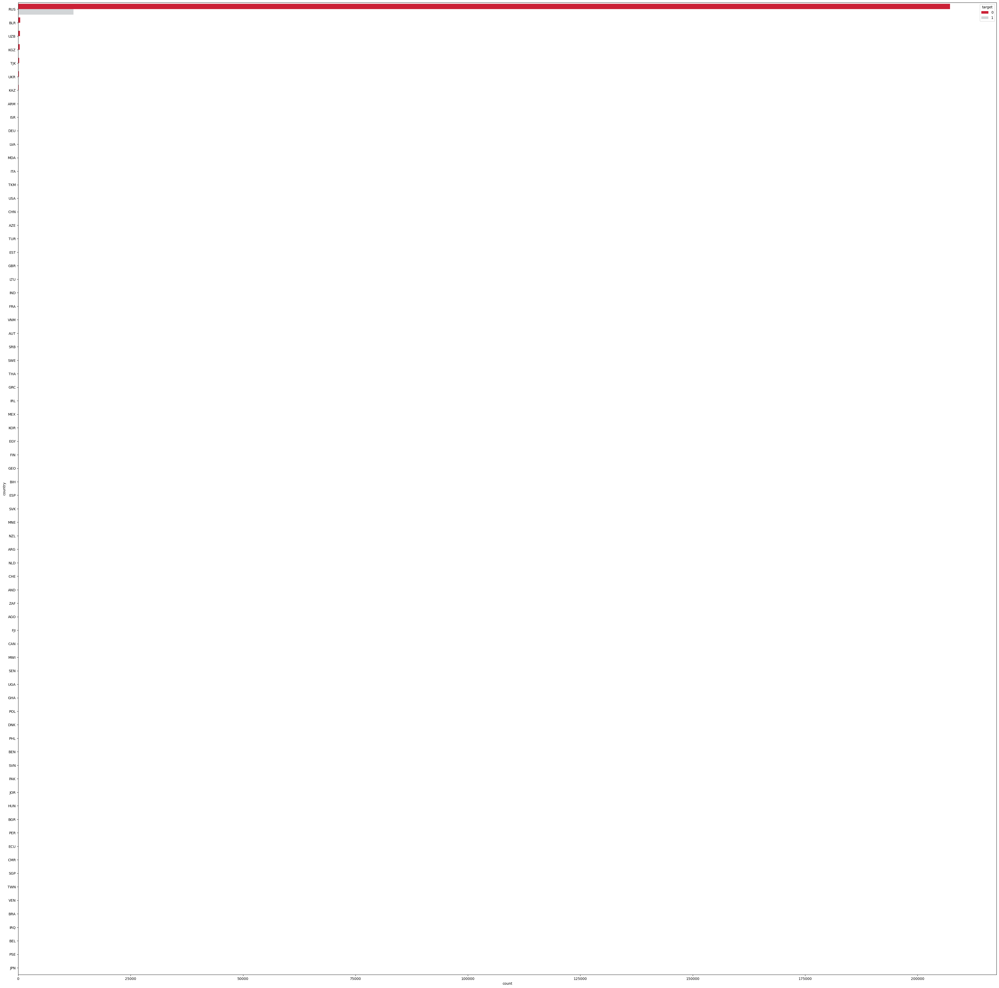

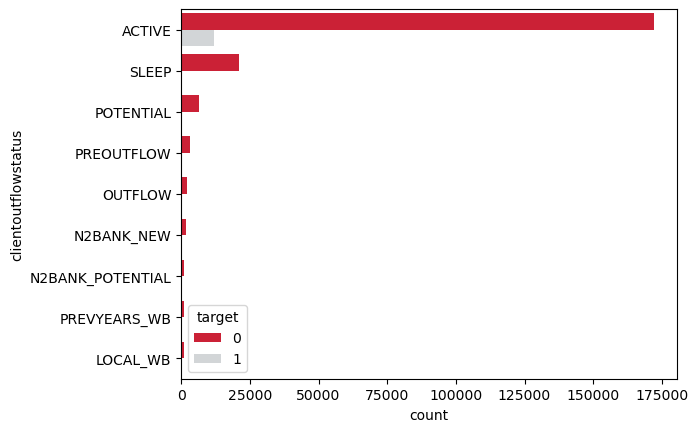

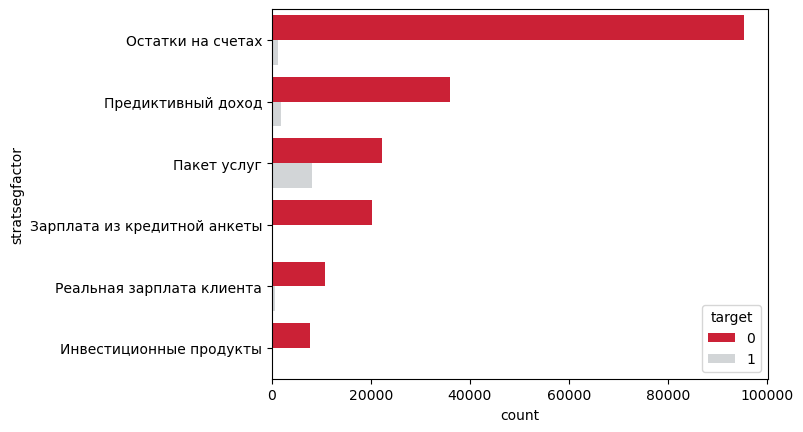

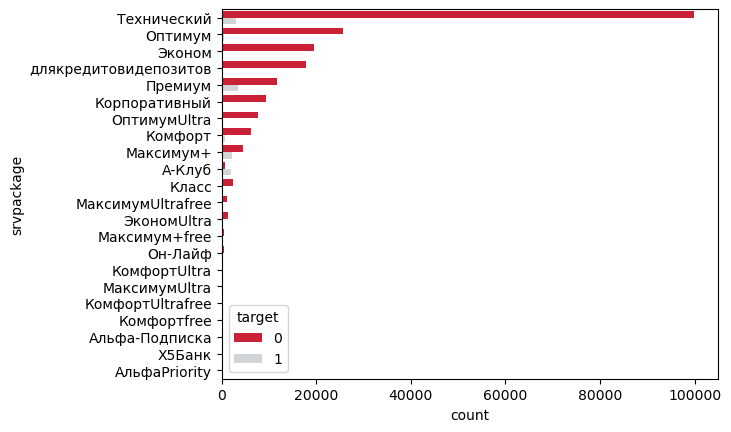

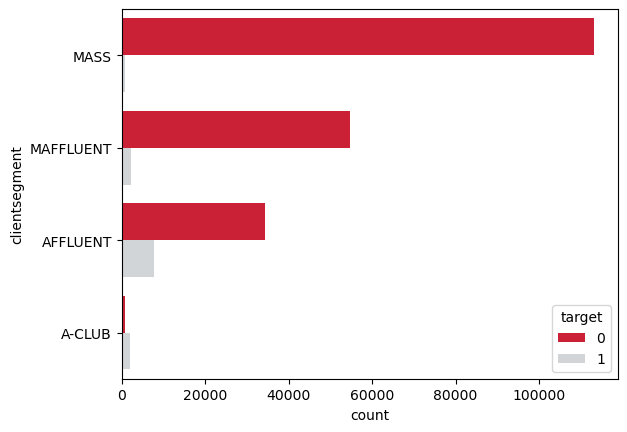

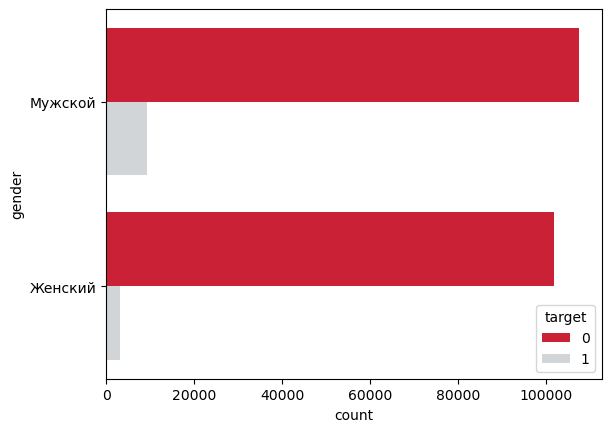

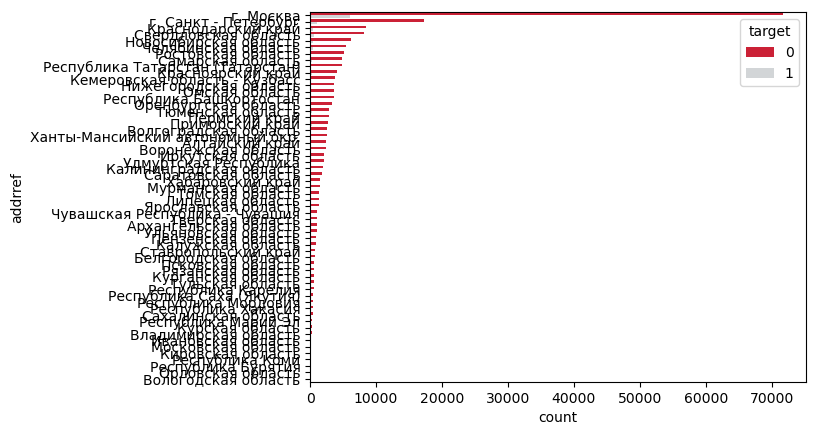

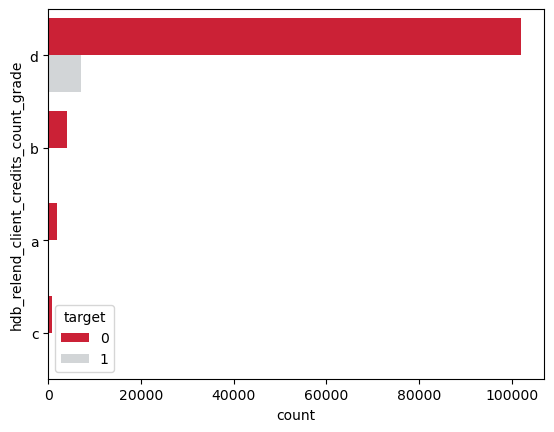

In [89]:
plot_all_cat_distributions(feat_cup_target[object_columns[2:]])

In [90]:
# import pylab as plt

def plot_all_num_distributions(dataframe, figsize=(50, 50)):
    max_shape = int(np.ceil(dataframe.shape[1] / 2))
    fig = plt.figure(figsize=figsize)
    for i, col in enumerate(dataframe.columns):
#         plt.subplot(max_shape, 2, i+1)
        _ = sns.kdeplot(x=col, data=dataframe, hue=feat_cup_target['target'], common_norm=True, palette=["#E70521", "#D1D5D8"])
        plt.show()

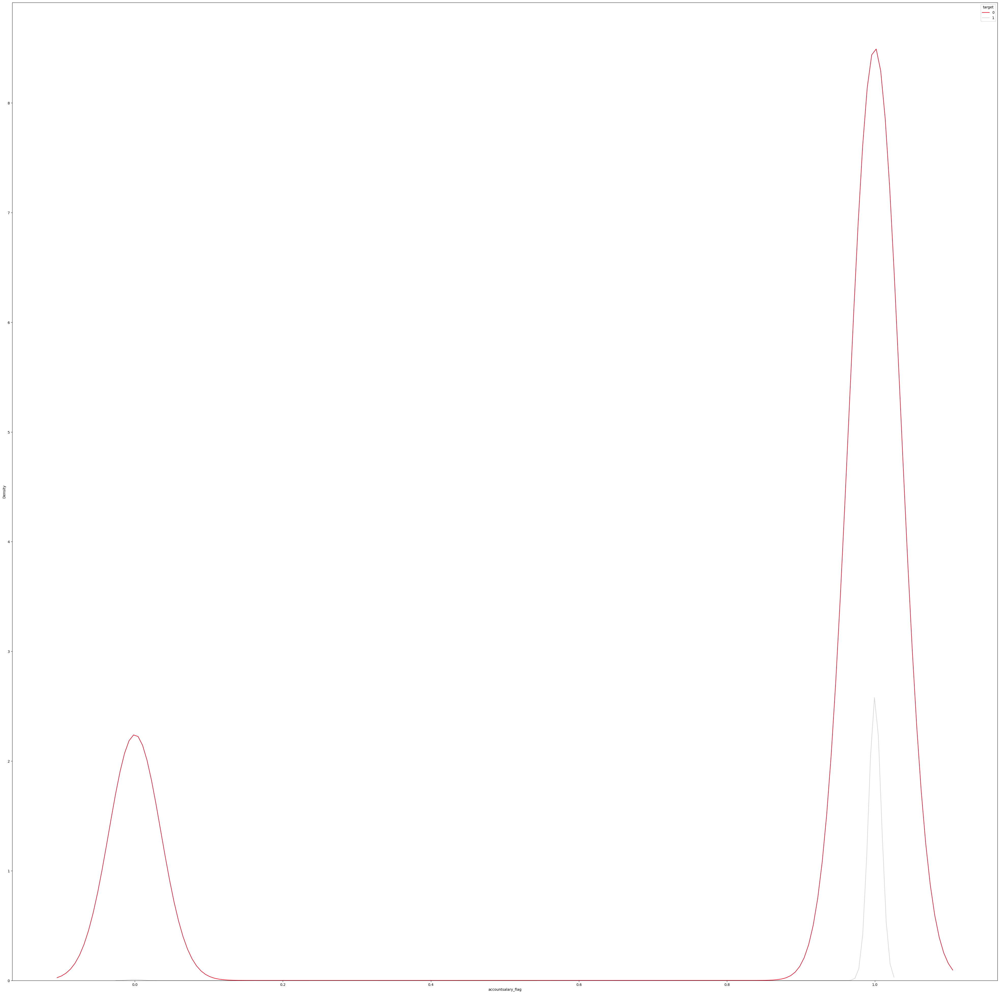

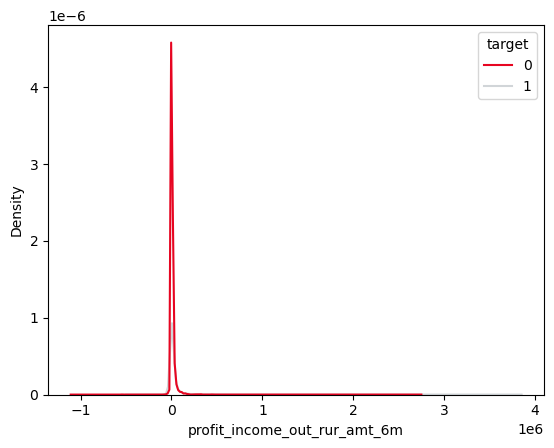

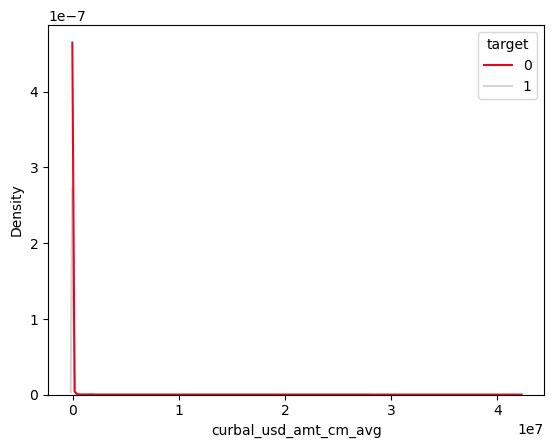

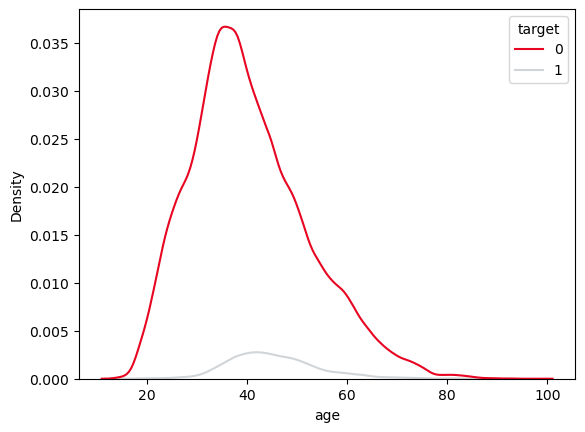

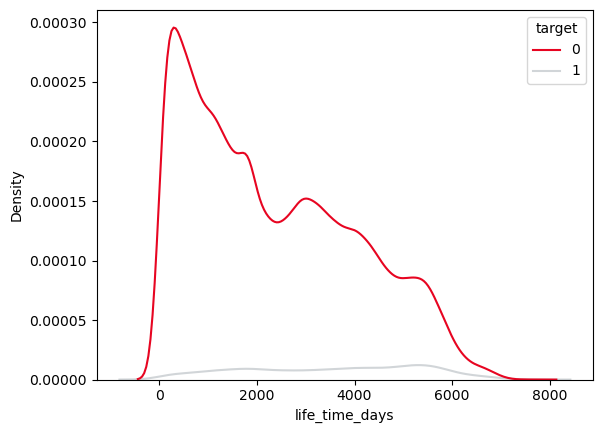

...

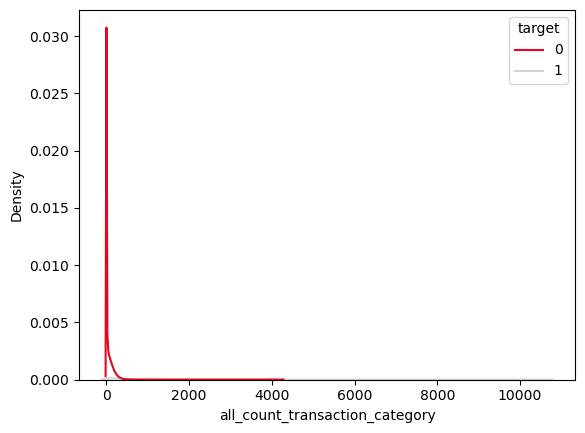

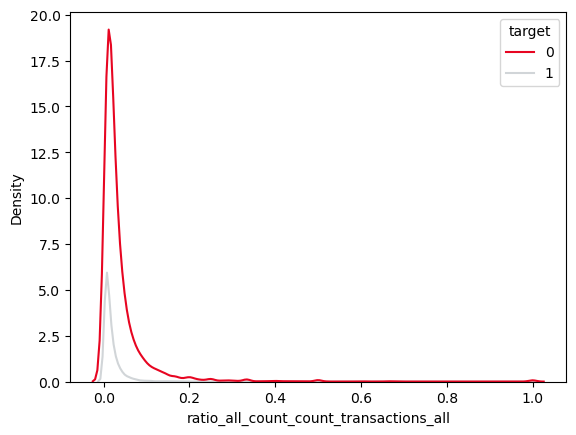

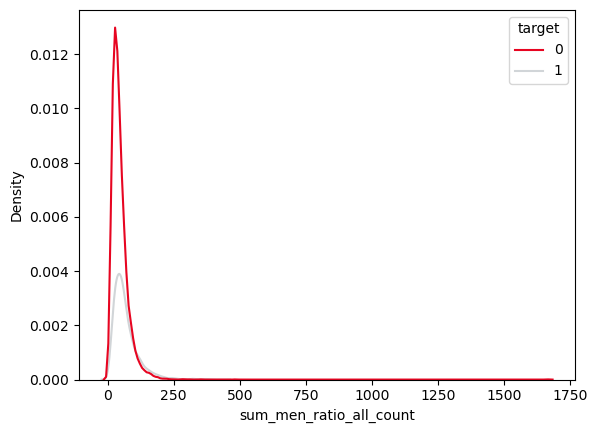

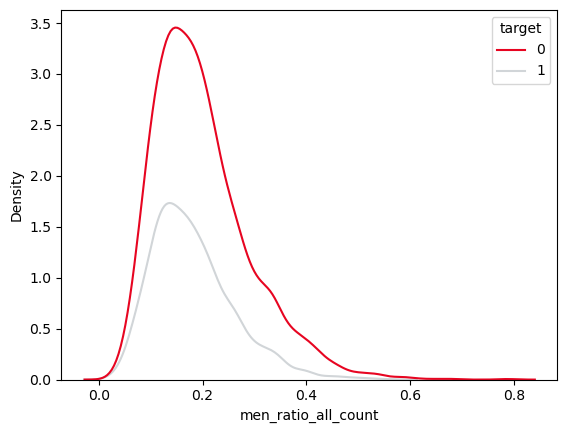

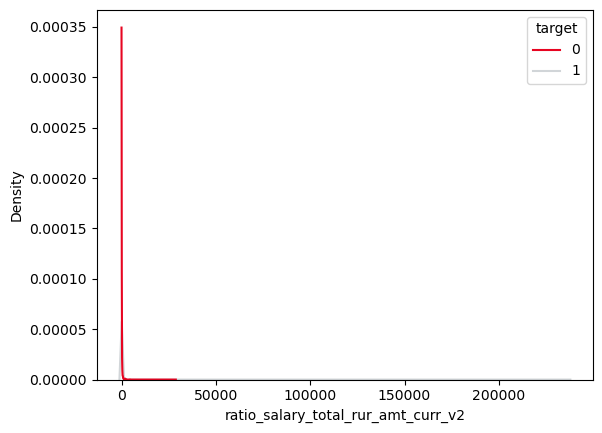

In [91]:
plot_all_num_distributions(feat_cup_target[float_columns])